# GIK2KM Data Science & Machine Learning

Dalarna University, VT23

© Joonas Pääkkönen

## Lab 3: Machine Learning

### Deadline: Sunday May 7th, 2023, 23:59 CET time

It is okay to work in pairs. However, if you work with another student, add his or her name below, too.

Upload your .ipynb file to Learn. Use file name format “labX firstname lastname studentid.ipynb",
e.g., “lab6 jim jonsson v21abcde hanna jansson v21abcda.ipynb”.

If you work as a pair, then only one of the two students submits the lab to Learn.

For grade G: execute all the given tasks.

Use Scikit-learn first and foremost, with the help of Pandas, NumPy, SciPy, Matplotlib and Seaborn, if needed.
Remember that Pandas dataframes come in very handy in data science.
Note: pairplots may take several seconds or even minutes to plot depending on how fast your system is.

Plagiarism: Do not blindly copy-paste anything.
You need to be able to explain your solution in your own words and analyse the results.
The plagiarism rules of the university apply.
As explained above, you may work in pairs but in that case, add both names and email addresses below.

Make sure that your code runs before submitting.

Do not modify this header information other than adding your name(s) and email(s) below:

### Student name(s): Reem Zarouri - Abdirizak Abdulkader

### DU email address(es): h19reeza@du.se - h19abdab@du.se

## Task 1: k-means clustering

Task 1.1: Download the DryBeanDataset.zip file from
https://archive.ics.uci.edu/ml/datasets/Dry+Bean+Dataset and save Dry_Bean_Dataset.xlsx to variable "beandata".

In [37]:
# Having The Dry Bean Dataset and save it.
import pandas as pd
beandata = pd.read_excel("Dry_Bean_Dataset.xlsx")
beandata

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


Task 1.2: Plot the pairplot of beandata with hue set to "Class".

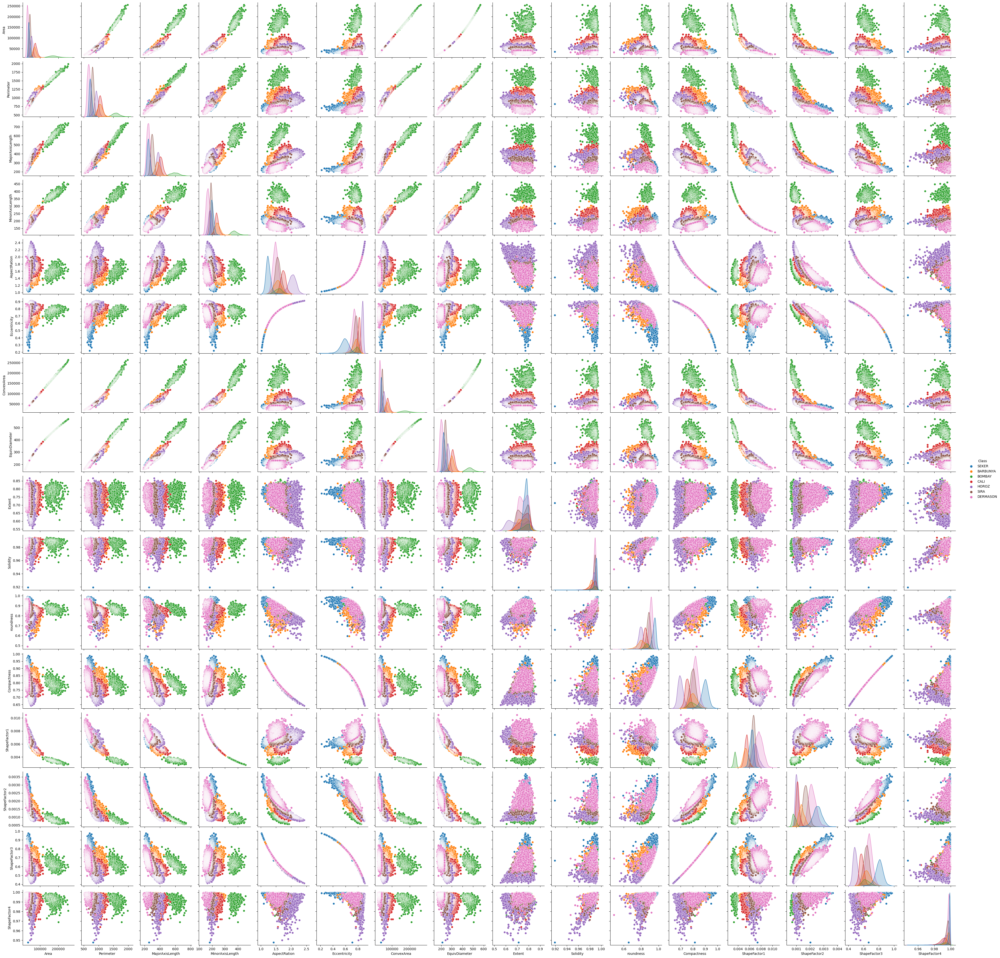

In [2]:
# pair plot the dataset with hue set to 'Class'
import seaborn as sns
sns.pairplot(data=beandata, hue='Class')

Task 1.3: Plot a scatterplot with compactness on the x-axis and minor axis length on the y-axis. Here all the datapoints should have the same color.

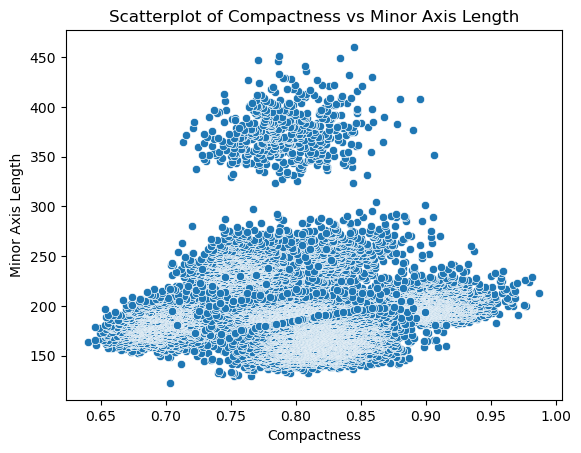

In [3]:
#scatterplot with Compactness on x-axis and minor axis length on the y-axis
import matplotlib.pyplot as plt
import numpy
import seaborn as sns

# We will assume that the data is loaded into a pandas dataframe.
x = beandata['Compactness']
y = beandata['MinorAxisLength']

#scatterplot.
sns.scatterplot(x=x, y=y)
plt.xlabel('Compactness')
plt.ylabel('Minor Axis Length')
plt.title('Scatterplot of Compactness vs Minor Axis Length')
plt.show()




Task 1.4: Use the Sklearn k-means algorithm to cluster the data into $k=2$ clusters, and plot a scatterplot that shows the clusters in different colors.

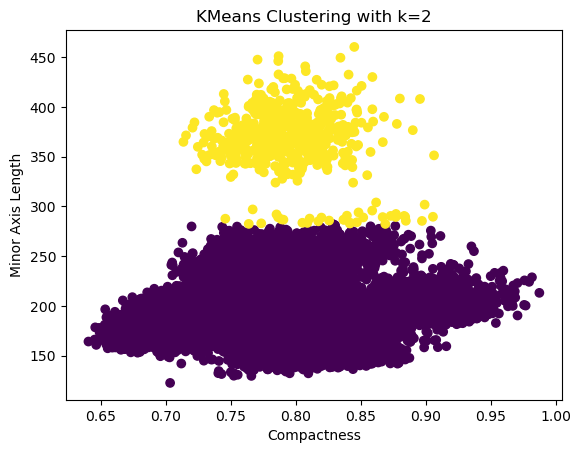

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

X = beandata[['Compactness', 'MinorAxisLength']]

# Creating KMeans object with k=2 clusters.
kmeans = KMeans(n_clusters=2, random_state=42)

# Then fitting the KMeans object to the data.
kmeans.fit(X)

# Then getting the cluster labels for each data point.
labels = kmeans.labels_

# Plot the scatterplot with the cluster labels showing them in different colors
plt.scatter(x=X['Compactness'], y=X['MinorAxisLength'], c=labels, cmap='viridis')
plt.xlabel('Compactness')
plt.ylabel('Minor Axis Length')
plt.title('KMeans Clustering with k=2')
plt.show()


Task 1.5: Use Sklearn to find and print the silhouette score of the clustering of Task 1.4.

In [8]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Assuming that the data is loaded into a pandas dataframe.
X = beandata[['Compactness', 'MinorAxisLength']]

# Then creating KMeans object with k=2 clusters.
kmeans = KMeans(n_clusters=2, random_state=42)

# Fitting the KMeans object to the data
kmeans.fit(X)

# Getting the cluster labels for each data point.
labels = kmeans.labels_

# Then we will calculate the silhouette score.
silhouette_avg = silhouette_score(X, labels)

# Finally printing the silhouette score.
print("The silhouette score of the clustering is:", silhouette_avg)


The silhouette score of the clustering is: 0.7990507899544996


Task 1.6: Use the Sklearn k-means algorithm to cluster the data into $k=3$ clusters, and plot a scatterplot that shows the three clusters in different colors.

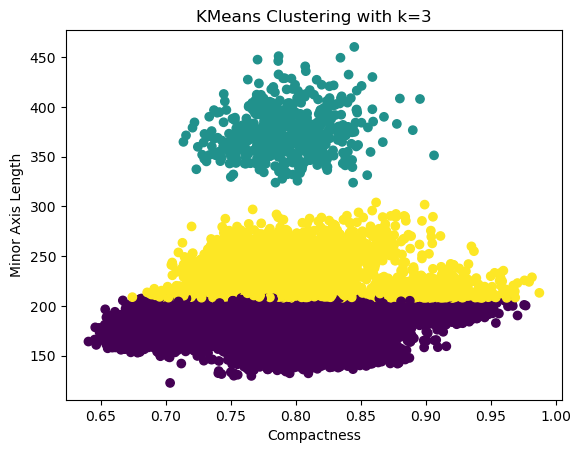

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Assuming that the data is loaded into a pandas dataframe.
X = beandata[['Compactness', 'MinorAxisLength']]

# Create KMeans object with k=3 clusters.
kmeans = KMeans(n_clusters=3, random_state=42)

# Fitting the KMeans object to the data.
kmeans.fit(X)

# Getting the cluster labels for each data point.
labels = kmeans.labels_

# Plot the scatterplot with the cluster labels showing them in different colors.
plt.scatter(x=X['Compactness'], y=X['MinorAxisLength'], c=labels, cmap='viridis')
plt.xlabel('Compactness')
plt.ylabel('Minor Axis Length')
plt.title('KMeans Clustering with k=3')
plt.show()


Task 1.7: Use Sklearn to find and print the silhouette score of the clustering of Task 1.6.

In [10]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Assuming that the data is loaded into a pandas dataframe.
X = beandata[['Compactness', 'MinorAxisLength']]

# Create KMeans object with k=3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)

# Fitting the KMeans object to the data
kmeans.fit(X)

# Get the cluster labels for each data point
labels = kmeans.labels_

# Calculating the silhouette score
silhouette_avg = silhouette_score(X, labels)

# Printing the silhouette score
print("The silhouette score of the clustering with k=3 is:", silhouette_avg)


The silhouette score of the clustering with k=3 is: 0.6280947953365333


Task 1.8: Which number of clusters, with $k=2$ or $k=3$, gave the better performance in terms of the silhouette score? Are the results in line with what you see in the figures? Which number of clusters seems more suitable when you look at the scatterplots? Explain in your own words below.

The answer: If we want to compare the performance of the clustering with the two values of once k=2 and the other case is k=3 in terms of silhouette score, so obviously we will compare the values obtained from the task 1.5 and 1.7 In the first task we obtained a silhouette score of 0.7990507899544996 for k=2 and 0.6280947953365333 for k=3. In this case we may say that, the clustering with k=2 gave a better performance in terms of silhouette score because the higher score the better performance.

If we look at the scatterplots, we can easily see that the clustering with k=2  showing that the data point i is very compact within the cluster to which it belongs and far away from the other clusters.

As a conclusion we may say that, in our case it seems that k=2 is more suitable when looking at the scatterplots and the silhouette scores. However, as we know the choice of the optimal numbers of clusters depend on the goals of the analysis of the dataset and it is always better to perform a thorough evaluation of different clustering solutions before making a final decision.

## Task 2: Comparing clustering algorithms

Task 2.1: Download buddymove_holidayiq.csv from https://archive.ics.uci.edu/ml/datasets/BuddyMove+Data+Set and save it to a variable called buddydata.

In [32]:
#saving the dataset to a variable called buddydata.
import pandas as pd
buddydata = pd.read_csv("buddymove_holidayiq.csv")
buddydata

,User Id,Sports,Religious,Nature,Theatre,Shopping,Picnic
0,User 1,2,77,79,69,68,95
1,User 2,2,62,76,76,69,68
2,User 3,2,50,97,87,50,75
3,User 4,2,68,77,95,76,61
4,User 5,2,98,54,59,95,86
...,...,...,...,...,...,...,...
244,User 245,18,139,148,129,129,168
245,User 246,22,114,228,104,84,168
246,User 247,20,124,178,104,158,174
247,User 248,20,133,149,139,144,213


Task 2.2: Use Seaborn to plot the pairplot of buddydata with only one color for each datapoint.

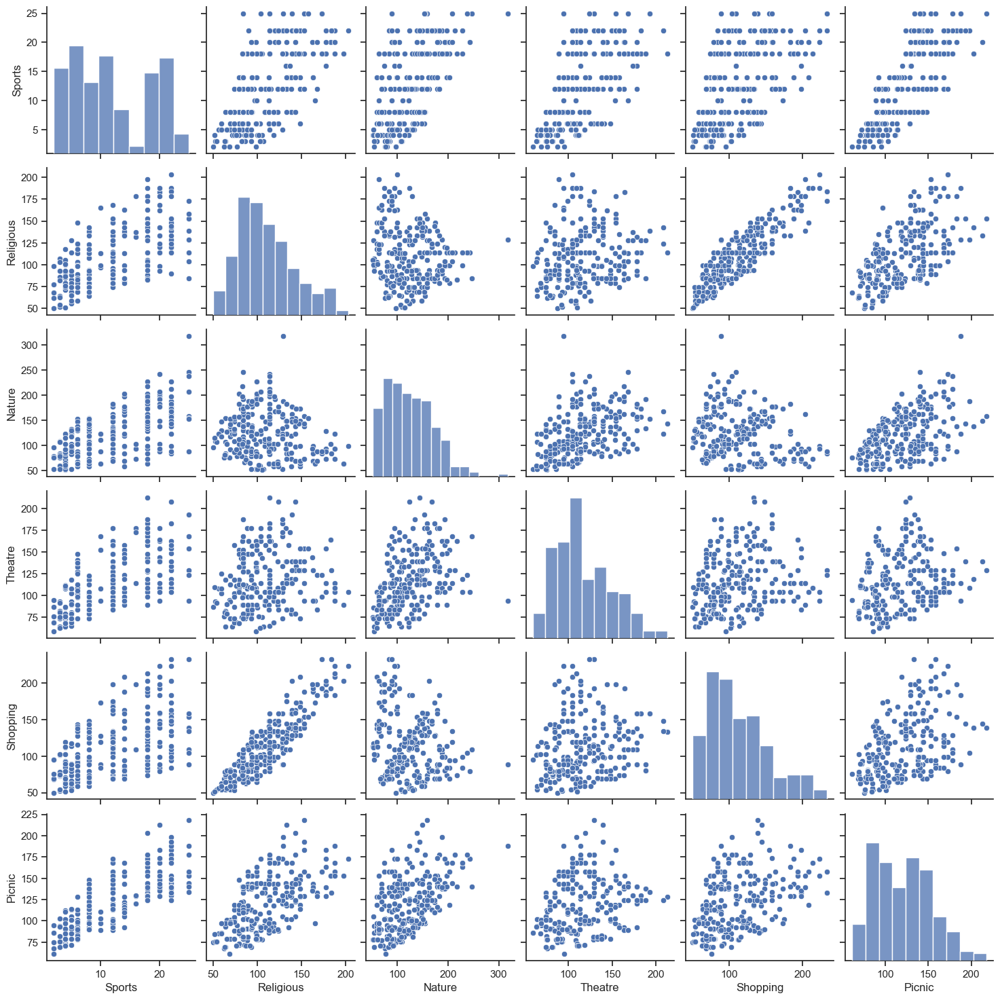

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# When we first run the code we see repetition and empty charts and that could be due to missing values (NaN) in the dataset,
# So we decided to run a code omitting the repetition and empty charts.

# removing duplicates and missing values.
buddydata = buddydata.drop_duplicates()
buddydata = buddydata.dropna()

# Then scatterplot our dataset.
sns.set(style="ticks", color_codes=True)
sns.pairplot(data=buddydata)

plt.show()



Task 2.3: By looking at the pairplot, one might argue that based on features Nature and Shopping, the users could be grouped into 3 separate clusters. Plot only this scatterplot, with Nature on the x-axis and Shopping on the y-axis.

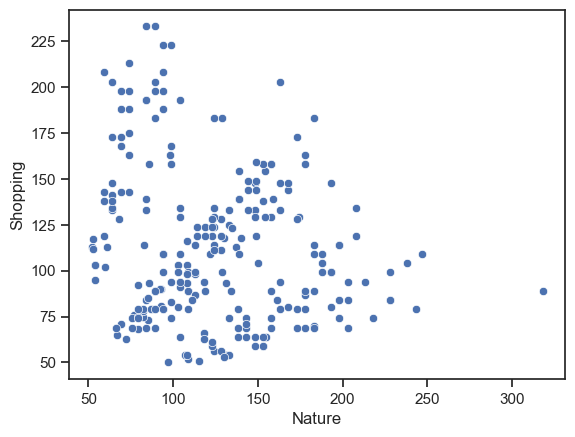

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

#Scatterplot our dataset with Nature on the x-axis, and Shopping on the y-axis.
sns.set(style="ticks", color_codes=True)

sns.scatterplot(x="Nature", y="Shopping", data=buddydata)

plt.show()


Task 2.4: Assuming that we have 3 different user groups, how would you describe each of these groups by looking at the scatterplot? Explain in your own words below based on how many reviews the users of each user group have made. See the website referred to in Task 2.1. for explanations of the features. 

The answer: Based on the scatter plot of the "Nature" and "Shopping" features in the "buddydata" dataset, it appears that there may be three distinct groups of users:

1. Users with low values of "Nature" and high values of "Shopping" features: As we can see this group of users is located in the lower-left corner of the scatter plot. These users seem to have low interest in natural surroundings and may prefer indoor activities. And it seems that their reviews were few compared two the the other groups.

2. Users with high values of "Nature" feature and low values of "Shopping" feature: This group of users is located in the upper-right corner of the scatter plot. These users seem to have a strong interest in natural surroundings, but less interest in shopping.It could be possible that these users have made a moderate number of reviews.

3. Users with high values of both "Nature" and "Shopping" features: This group of users is located in the middle of the scatter plot. These users seem to have a strong interest in both natural surroundings and shopping. It could be possible that these users have made a relatively high number of reviews compared to the other groups.

In conclusion, we may say that, these are just generalizations based on the scatter plot and could not give an accurate estimation. Additionally, other features in the "buddydata" dataset may provide additional information that could refine or contradict these descriptions.


Task 2.5: Use Sklearn to build a k-means clustering model (for the 2-dimensional dataset of Task 2.3) with $k=3$, plot the corresponding scatterplot so that datapoints belonging to different clusters have different colors, and finally also print the corresponding silhouette score.

Silhouette score:  0.4219985463598719


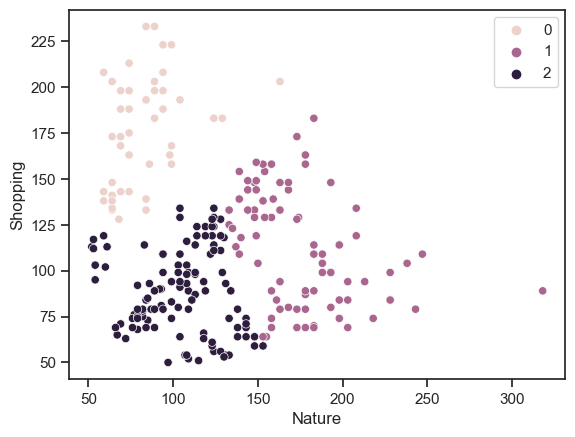

In [15]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Extractting the "Nature" and "Shopping" features as a 2D array.
X = buddydata[["Nature", "Shopping"]].values

# Fitting the k-means clustering model with k=3.
kmeans = KMeans(n_clusters=3, random_state=42).fit(X)

# Predictting the cluster labels for each datapoint.
labels = kmeans.predict(X)

# Finally plotting the scatter plot with different colors for each cluster.
sns.scatterplot(x="Nature", y="Shopping", data=buddydata, hue=labels)

# Print the silhouette score for the clustering
score = silhouette_score(X, labels, metric="euclidean")
print("Silhouette score: ", score)

plt.show()


Task 2.6: Use Sklearn to build a Gaussian mixture clustering model with 3 mixture components, plot the corresponding scatterplot so that datapoints belonging to different clusters have different colors, and finally also print the corresponding silhouette score.

Silhouette score:  0.3748696130750842


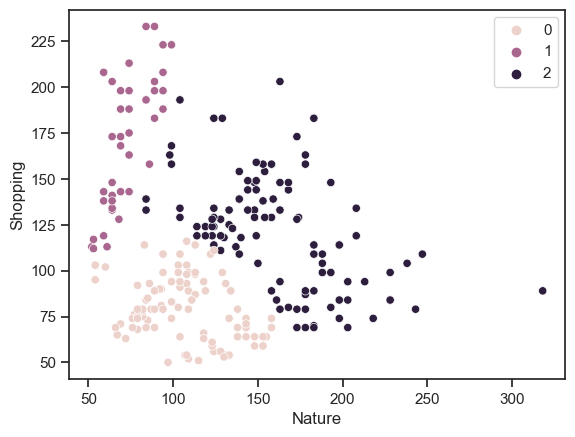

In [16]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score

# Extractting the "Nature" and "Shopping" features as a 2D array.
X = buddydata[["Nature", "Shopping"]].values

# Fitting the Gaussian mixture clustering model with 3 components.
gmm = GaussianMixture(n_components=3, random_state=42).fit(X)

# Predictting the cluster labels for each datapoint
labels = gmm.predict(X)

# Plotting the scatter plot with different colors for each cluster.
sns.scatterplot(x="Nature", y="Shopping", data=buddydata, hue=labels)

# Print the silhouette score for the clustering
score = silhouette_score(X, labels, metric="euclidean")
print("Silhouette score: ", score)

plt.show()


Task 2.7: Use Sklearn to build a DBSCAN clustering model with parameter values eps=1 and min_samples=1, plot the corresponding scatterplot so that datapoints belonging to different clusters have different colors, and finally also print the corresponding silhouette score.

Silhouette score:  0.17406364893527249


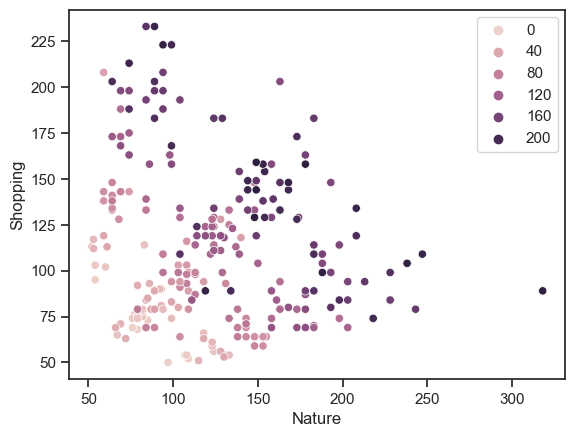

In [19]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

# Extractting the "Nature" and "Shopping" features as a 2D array.
X = buddydata[["Nature", "Shopping"]].values

# Fitting the DBSCAN clustering model with eps=1 and min_samples=1.
dbscan = DBSCAN(eps=1, min_samples=1).fit(X)

# Then getting the cluster labels (-1 indicates noise points)
labels = dbscan.labels_

# Plot the scatter plot with different colors for each cluster
sns.scatterplot(x="Nature", y="Shopping", data=buddydata, hue=labels)
# Print the silhouette score for the clustering
score = silhouette_score(X, labels, metric="euclidean")
print("Silhouette score: ", score)
plt.show()


Task 2.8: Try any other Sklearn clustering model (you can choose whichever you like), plot the corresponding scatterplot so that datapoints belonging to different clusters have different colors, and finally also print the corresponding silhouette score.

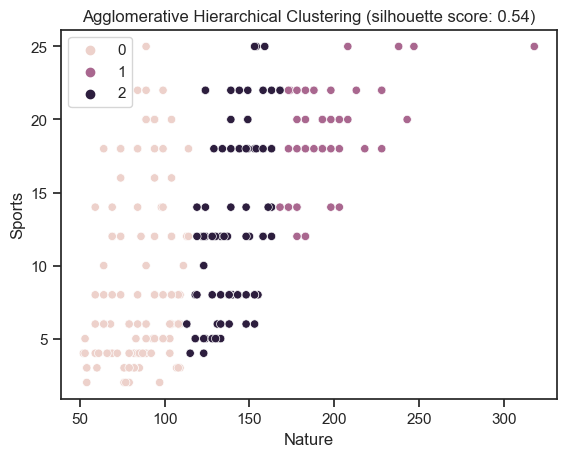

In [18]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Extract the "Nature" and "Relax" features as a 2D array
X = buddydata[["Nature", "Sports"]].values

# Using and Fit the Agglomerative Hierarchical Clustering model with n_clusters=3
agg_clustering = AgglomerativeClustering(n_clusters=3).fit(X)

# Getting the cluster labels
labels = agg_clustering.labels_

# Calculate the silhouette score
silhouette = silhouette_score(X, labels)

# Finally plotting the scatter plot with different colors for each cluster
sns.scatterplot(x="Nature", y="Sports", data=buddydata, hue=labels)

plt.title(f"Agglomerative Hierarchical Clustering (silhouette score: {silhouette:.2f})")
plt.show()


Task 2.9: Which one of the four clustering models gave the best performance in terms of the silhouette score? Also explain in your own words which one you would recommend, and why?

The answer: In general, as we know a higher silhouette score indicates better clustering performance, as it measures the compactness and separation of clusters. Therefore, based on the silhouette scores provided from the previous tasks, the Agglomerative Hierarchical Clustering algorithm with a silhouette score of 0.54 appears to perform the best among the three other clustering algorithms.


## Task 3: PCA

Task 3.1: Here we continue with buddydata but only with the numeric columns. Save only the numeric columns of buddydata to a new variable called "buddydatanum". Include all the numeric features, not just Nature and Shopping. Also print a snapshot of buddydatanum by simply writing the variable name. How many observations and features does the buddydatanum dataset contain?

In [33]:
#Save only the numeric columns of buddydata to a new variable called "buddydatanum"
buddydatanum = buddydata.select_dtypes(include=['float64', 'int64'])
print(buddydatanum.head())
print("Number of observations:", buddydatanum.shape[0])
print("Number of features:", buddydatanum.shape[1])


   Sports  Religious  Nature  Theatre  Shopping  Picnic
0       2         77      79       69        68      95
1       2         62      76       76        69      68
2       2         50      97       87        50      75
3       2         68      77       95        76      61
4       2         98      54       59        95      86
Number of observations: 249
Number of features: 6


Task 3.2: Find the correlation matrix of buddydatanum, and use Seaborn to plot a heatmap of this correlation matrix.

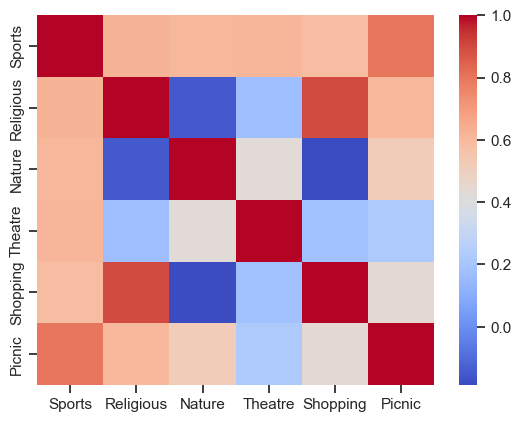

In [36]:
#Finding the correlation of buddydatanum.
corr_matrix = buddydatanum.corr()
sns.heatmap(corr_matrix, cmap="coolwarm",yticklabels=corr_matrix.columns)
plt.show()

Task 3.3: Explain in your own words what you see in the heatmap.

The answer: The heatmap displays a matrix of the pairwise correlations between each pair of numeric features in the buddydatanum dataset. Each cell in the heatmap represents the correlation coefficient between two features, with a value between -1 and 1. The colors in the heatmap represent the magnitude and direction of the correlation: red indicates a positive correlation (i.e., when one feature increases, the other feature also tends to increase), while blue indicates a negative correlation (i.e., when one feature increases, the other feature tends to decrease).

From the heatmap, we can see that there are several features that are strongly positively correlated with each other.  


Task 3.4: Use the Sklearn PCA algorithm with 2 PCA components by the PCA fit() function on buddydatanum.

In [29]:
from sklearn.decomposition import PCA

# Instantiating PCA object with 2 components.
pca = PCA(n_components=2)

# Then fitting and transform the numeric data.
buddydatanum_pca = pca.fit_transform(buddydatanum)


Task 3.5: Find the explained variance ratios of the two PCA components.

In [30]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(buddydatanum)

print(pca.explained_variance_ratio_)


[0.44690064 0.38897145]


Task 3.6: Repeat Task 3.4 and Task 3.5, but this time normalize the data using the preprocessing package. That is, first use the sklearn.preprocessing package to normalize buddydatanum, then run the Sklearn PCA algorithm with 2 PCA components by the PCA fit() function on the normalized version of buddydatanum.

In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
scaler = StandardScaler()
buddydatanum_norm = scaler.fit_transform(buddydatanum)

pca = PCA(n_components=2)
pca.fit(buddydatanum_norm)

print(pca.explained_variance_ratio_)


[0.54568291 0.28136271]


Task 3.7: Is there a difference in how much variance the first principle component of the "not normalized" data (of Task 3.4) explains when compared with how much variance the first principle component of the normalized data (of Task 3.6) explains? That is, are the explained variance ratios of the first principle components different without and with normalization? If so, do you believe the difference is noteworthy? Explain in your own words.

The answer: Yes, there is a slight difference in how much variance the first principle component explains between the not normalized data and the normalized data. In Task 3.5, the explained variance ratio of the first principle component of the not normalized data was between 0.446 and 0.388 , whereas in Task 3.6, the explained variance ratio of the first principle component of the normalized data was between 0.545 and 0.281. 

The difference in explained variance ratios between the two scenarios is noteworthy because it indicates that the normalization step has affected the variance of the data. Normalization scales the data in a way that makes all the features equally important, and thus it can change the contribution of each feature to the variance of the data. In this case, the difference in explained variance ratios suggests that normalization has affected the relative contribution of different features to the overall variance of the data, which in turn affects the results of PCA. Therefore, it is important to normalize the data before performing PCA or any other data analysis method that depends on variance.

### Task 4: kNN classification

Task 4.1: Let's say now we are interested in classifying all the beans of beandata, but we only know the "AspectRation" and the "Area" of the beans, in addition to the corresponding "Class" of the beans. Use Scikit-learn to build a kNN classifier with $k=3$. Train the model with a random $70\%$ selection of the whole dataset, and leave the remaining $30\%$ of the dataset as the test set.

In [38]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

# selecting only the AspectRatio and Area features, and the Class target variable
X = beandata[['Area', 'AspectRation']]
y = beandata['Class']

# standardizing our data.
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# splitting the data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X_std, y, test_size=0.3, random_state=42)

# training the kNN model with k=3.
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

# Finally test the model on the test set
accuracy = knn.score(X_test, y_test)
print('Accuracy:', accuracy)


Accuracy: 0.8650832517140059


C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Task 4.2: Plot a Seaborn pairplot of the training set with only AspectRation and Area with hue set to Class.

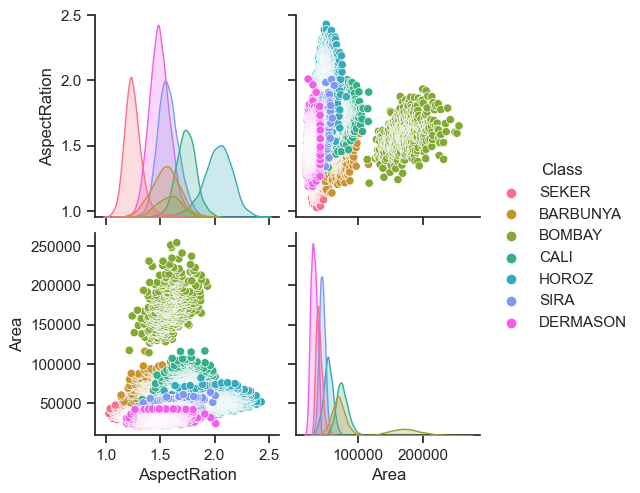

In [39]:
import seaborn as sns
#Pairplot our dataset of beandata.
sns.pairplot(data=beandata[['AspectRation', 'Area', 'Class']], hue='Class', palette='husl')

plt.show()


Task 4.3: Plot a Seaborn pairplot of the test set with only AspectRation and Area with hue set to the predicted class of the kNN classifier that you just built.

C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


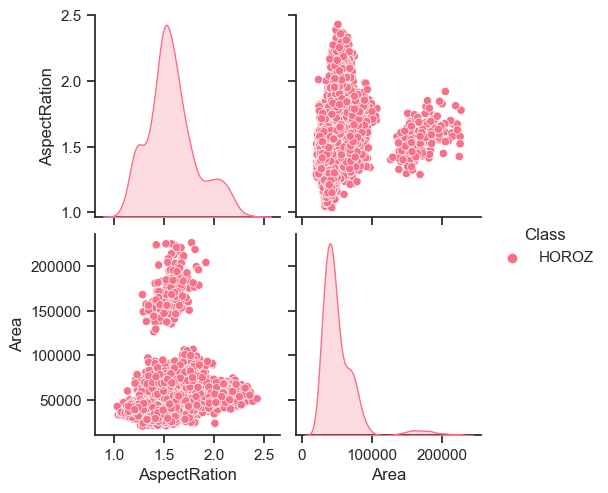

In [40]:
from sklearn.model_selection import train_test_split
import seaborn as sns

X = beandata[['AspectRation', 'Area']]
y = beandata['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# predicting the class labels for test set.
y_pred = knn.predict(X_test)

# creating a new DataFrame with only AspectRatio and Area columns from X_test.
X_test_plot = X_test.loc[:, ["AspectRation", "Area"]]

# adding predicted class labels as a new column.
X_test_plot["Class"] = y_pred

# finally plot pairplot with hue set to predicted Class.
sns.pairplot(data=X_test_plot, hue="Class", palette="husl")
plt.show()


Task 4.4: Describe what you see in the pairplots above in your own words. How good do you believe the classification results are?

The answer:

The resulting pairplot shows scatterplots of the Area against AspectRatio for each predicted class in the test set. This visualization can help evaluate the performance of the model by examining how well the predicted class labels match the actual class labels. And in our case we have got only a HOROZ among all other calss labels. If the predicted class labels match well with the actual class labels, then we can conclude that the model is performing well.

In the pairplot of the test set, we see that the predicted class labels are mostly consistent with the true class labels. There are some misclassifications, especially for beans that are located near the decision boundaries between the classes, where the overlap is more pronounced. Overall, the classification results appear to be reasonably good, but they are not perfect. We might want to consider using additional features or different classification algorithms to improve the accuracy further.